# YOLO V2 with TensorFlow 2.0

In [ ]:
import os
import glob
import re
import numpy as np
import cv2
import math
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
import imgaug as ia
import random
import sklearn.metrics
from imgaug import augmenters as iaa
from statistics import mean

In [ ]:
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
import datetime,os
from tensorflow.keras.layers import Concatenate, concatenate, Dropout, LeakyReLU, Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from time import time

In [ ]:
%load_ext tensorboard
#!rm -rf drive/My Drive/Colab Notebooks/logs

In [ ]:
print('Tensorflow version : {}'.format(tf.__version__))


print('\nGPU : {}'.format(tf.config.list_physical_devices('GPU')))
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)
"""
resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])
tf.config.experimental_connect_to_cluster(resolver)
# This is the TPU initialization code that has to be at the beginning.
tf.tpu.experimental.initialize_tpu_system(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))
"""

Tensorflow version : 2.2.0

GPU : []


'\nresolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu=\'grpc://\' + os.environ[\'COLAB_TPU_ADDR\'])\ntf.config.experimental_connect_to_cluster(resolver)\n# This is the TPU initialization code that has to be at the beginning.\ntf.tpu.experimental.initialize_tpu_system(resolver)\nprint("All devices: ", tf.config.list_logical_devices(\'TPU\'))\n'

In [ ]:
# Parameters
LABELS           = ('Person', 'Car', 'Motorcycle')
IMAGE_H, IMAGE_W = 512, 512
GRID_H,  GRID_W  = 16, 16 # GRID size = IMAGE size / 32
BOX              = 5
CLASS            = len(LABELS)
SCORE_THRESHOLD  = 0.55
IOU_THRESHOLD    = 0.5
ANCHORS          = [0.57273, 0.677385, 1.87446, 2.06253, 3.33843, 5.47434, 7.88282, 3.52778, 9.77052, 9.16828]

TRAIN_BATCH_SIZE = 8
VAL_BATCH_SIZE   = 8
EPOCHS           = 400

LAMBDA_NOOBJECT  = 1
LAMBDA_OBJECT    = 5
LAMBDA_CLASS     = 1
LAMBDA_COORD     = 1

max_annot        = 0

In [ ]:
NOME_PESI='Verificato_All/Epoch:249.h5'
if NOME_PESI!='':
  SALTA_TRAIN = True
else:
  SALTA_TRAIN = False

In [ ]:
# Train and validation directory
Dataset="Verificato_NoPercentageSubclasses"
#Dataset_Validation=Dataset
Dataset_Validation="Verificato_All"

train_image_folder = 'drive/My Drive/Colab Notebooks/Dataset/'+Dataset+'/train/image/'
train_annot_folder = 'drive/My Drive/Colab Notebooks/Dataset/'+Dataset+'/train/annotation/'
val_image_folder = 'drive/My Drive/Colab Notebooks/Dataset/'+Dataset_Validation+'/validation/image/'
val_annot_folder = 'drive/My Drive/Colab Notebooks/Dataset/'+Dataset_Validation+'/validation/annotation/'

# 1. Define YOLO model

In [ ]:
# Custom Keras layer

class SpaceToDepth(keras.layers.Layer):

    def __init__(self, block_size, **kwargs):
        self.block_size = block_size
        super(SpaceToDepth, self).__init__(**kwargs)

    def call(self, inputs):
        x = inputs
        batch, height, width, depth = K.int_shape(x)
        batch = -1
        reduced_height = height // self.block_size
        reduced_width = width // self.block_size
        y = K.reshape(x, (batch, reduced_height, self.block_size,
                             reduced_width, self.block_size, depth))
        z = K.permute_dimensions(y, (0, 1, 3, 2, 4, 5))
        t = K.reshape(z, (batch, reduced_height, reduced_width, depth * self.block_size **2))
        return t

    def compute_output_shape(self, input_shape):
        shape =  (input_shape[0], input_shape[1] // self.block_size, input_shape[2] // self.block_size,
                  input_shape[3] * self.block_size **2)
        return tf.TensorShape(shape)

In [ ]:
# Yolo model (thanks to https://github.com/experiencor/keras-yolo2)

input_image = tf.keras.layers.Input((IMAGE_H, IMAGE_W, 3), dtype='float32')

# Layer 1
x = Conv2D(32, (3,3), strides=(1,1), padding='same', name='conv_1', use_bias=False)(input_image)
x = BatchNormalization(name='norm_1')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 2
x = Conv2D(64, (3,3), strides=(1,1), padding='same', name='conv_2', use_bias=False)(x)
x = BatchNormalization(name='norm_2')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 3
x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_3', use_bias=False)(x)
x = BatchNormalization(name='norm_3')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 4
x = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_4', use_bias=False)(x)
x = BatchNormalization(name='norm_4')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 5
x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_5', use_bias=False)(x)
x = BatchNormalization(name='norm_5')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 6
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_6', use_bias=False)(x)
x = BatchNormalization(name='norm_6')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 7
x = Conv2D(128, (1,1), strides=(1,1), padding='same', name='conv_7', use_bias=False)(x)
x = BatchNormalization(name='norm_7')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 8
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_8', use_bias=False)(x)
x = BatchNormalization(name='norm_8')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 9
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_9', use_bias=False)(x)
x = BatchNormalization(name='norm_9')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 10
x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_10', use_bias=False)(x)
x = BatchNormalization(name='norm_10')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 11
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_11', use_bias=False)(x)
x = BatchNormalization(name='norm_11')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 12
x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_12', use_bias=False)(x)
x = BatchNormalization(name='norm_12')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 13
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_13', use_bias=False)(x)
x = BatchNormalization(name='norm_13')(x)
x = LeakyReLU(alpha=0.1)(x)

skip_connection = x

x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 14
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_14', use_bias=False)(x)
x = BatchNormalization(name='norm_14')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 15
x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_15', use_bias=False)(x)
x = BatchNormalization(name='norm_15')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 16
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_16', use_bias=False)(x)
x = BatchNormalization(name='norm_16')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 17
x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_17', use_bias=False)(x)
x = BatchNormalization(name='norm_17')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 18
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_18', use_bias=False)(x)
x = BatchNormalization(name='norm_18')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 19
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_19', use_bias=False)(x)
x = BatchNormalization(name='norm_19')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 20
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_20', use_bias=False)(x)
x = BatchNormalization(name='norm_20')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 21
skip_connection = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_21', use_bias=False)(skip_connection)
skip_connection = BatchNormalization(name='norm_21')(skip_connection)
skip_connection = LeakyReLU(alpha=0.1)(skip_connection)

skip_connection = SpaceToDepth(block_size=2)(skip_connection)

x = concatenate([skip_connection, x])

# Layer 22
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_22', use_bias=False)(x)
x = BatchNormalization(name='norm_22')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Dropout(0.3)(x) # add dropout

# Layer 23
x = Conv2D(BOX * (4 + 1 + CLASS), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
output = Reshape((GRID_W, GRID_H, BOX, 4 + 1 + CLASS))(x)

model = keras.models.Model(input_image, output)

In [ ]:
#model.summary()

# 2. Load YOLO pretrained weigts

In [ ]:
class WeightReader:
    def __init__(self, weight_file):
        self.offset = 4
        self.all_weights = np.fromfile(weight_file, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]
    
    def reset(self):
        self.offset = 4

In [ ]:
weight_reader = WeightReader('drive/My Drive/Colab Notebooks/weights/yolo.weights')

In [ ]:
weight_reader.reset()
nb_conv = 23

for i in range(1, nb_conv+1):
    conv_layer = model.get_layer('conv_' + str(i))
    conv_layer.trainable = True
    
    if i < nb_conv:
        norm_layer = model.get_layer('norm_' + str(i))
        norm_layer.trainable = True
        
        size = np.prod(norm_layer.get_weights()[0].shape)

        beta  = weight_reader.read_bytes(size)
        gamma = weight_reader.read_bytes(size)
        mean  = weight_reader.read_bytes(size)
        var   = weight_reader.read_bytes(size)

        weights = norm_layer.set_weights([gamma, beta, mean, var])       
        
    if len(conv_layer.get_weights()) > 1:
        bias   = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel, bias])
    else:
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel])

In [ ]:
layer   = model.layers[-2] # last convolutional layer
layer.trainable = True


weights = layer.get_weights()

new_kernel = np.random.normal(size=weights[0].shape)/(GRID_H*GRID_W)
new_bias   = np.random.normal(size=weights[1].shape)/(GRID_H*GRID_W)

layer.set_weights([new_kernel, new_bias])

# 3. Data generator

In [ ]:
def parse_annotation(ann_dir, img_dir, labels):
    '''
    Parse XML files in PASCAL VOC format.
    
    Parameters
    ----------
    - ann_dir : annotations files directory
    - img_dir : images files directory
    - labels : labels list
    
    Returns
    -------
    - imgs_name : numpy array of images files path (shape : images count, 1)
    - true_boxes : numpy array of annotations for each image (shape : image count, max annotation count, 5)
        annotation format : xmin, ymin, xmax, ymax, class
        xmin, ymin, xmax, ymax : image unit (pixel)
        class = label index
    '''
    
    max_annot = 0
    imgs_name = []
    annots = []
    
    # Parse file
    for ann in sorted(os.listdir(ann_dir)):
        annot_count = 0
        boxes = []
        tree = ET.parse(ann_dir + ann)
        for elem in tree.iter(): 
            if 'filename' in elem.tag:
                imgs_name.append(img_dir + elem.text)
            if 'width' in elem.tag:
                w = int(elem.text)
            if 'height' in elem.tag:
                h = int(elem.text)
            if 'object' in elem.tag or 'part' in elem.tag:                  
                box = np.zeros((5))
                for attr in list(elem):
                    if 'name' in attr.tag:
                        box[4] = labels.index(attr.text) + 1 # 0:label for no bounding box
                    if 'bndbox' in attr.tag:
                        annot_count += 1
                        for dim in list(attr):
                            if 'xmin' in dim.tag:
                                box[0] = int(round(float(dim.text)))
                            if 'ymin' in dim.tag:
                                box[1] = int(round(float(dim.text)))
                            if 'xmax' in dim.tag:
                                box[2] = int(round(float(dim.text)))
                            if 'ymax' in dim.tag:
                                box[3] = int(round(float(dim.text)))
                boxes.append(np.asarray(box))
        
        if w != IMAGE_W or h != IMAGE_H :
            print('Image size error')
            break
            
        annots.append(np.asarray(boxes))
        

        if annot_count > max_annot:
            max_annot = annot_count
           
    # Rectify annotations boxes : len -> max_annot
    imgs_name = np.array(imgs_name)  
    true_boxes = np.zeros((imgs_name.shape[0], max_annot, 5))
    for idx, boxes in enumerate(annots):
        true_boxes[idx, :boxes.shape[0], :5] = boxes
        
    return imgs_name, true_boxes

## 3.1. Dataset

In [ ]:
def parse_function(img_obj, true_boxes):
    x_img_string = tf.io.read_file(img_obj)
    x_img = tf.image.decode_png(x_img_string, channels=3) # dtype=tf.uint8
    x_img = tf.image.convert_image_dtype(x_img, tf.float32) # pixel value /255, dtype=tf.float32, channels : RGB
    return x_img, true_boxes

def get_dataset(img_dir, ann_dir, labels, batch_size):
    '''
    Create a YOLO dataset
    
    Parameters
    ----------
    - ann_dir : annotations files directory
    - img_dir : images files directory
    - labels : labels list
    - batch_size : int
    
    Returns
    -------
    - YOLO dataset : generate batch
        batch : tupple(images, annotations)
        batch[0] : images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch[1] : annotations : tensor (shape : batch_size, max annot, 5)
    Note : image pixel values = pixels value / 255. channels : RGB
    '''
    if "train" in img_dir:
      print("Train")
    if "validation" in img_dir:
      print("Validation")

    imgs_name, bbox = parse_annotation(ann_dir, img_dir, LABELS)
    dataset = tf.data.Dataset.from_tensor_slices((imgs_name, bbox))    
    dataset = dataset.shuffle(len(imgs_name))
    dataset = dataset.repeat()
    dataset = dataset.map(parse_function, num_parallel_calls=20)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(10)
    print('-------------------')
    print('Dataset:')
    print('Images count: {}'.format(len(imgs_name)))
    print('Step per epoch: {}'.format(len(imgs_name) // batch_size))
    print('Images per epoch: {}'.format(batch_size * (len(imgs_name) // batch_size)))
    return dataset

In [ ]:
train_dataset = None
train_dataset= get_dataset(train_image_folder, train_annot_folder, LABELS, TRAIN_BATCH_SIZE)

val_dataset = None
val_dataset= get_dataset(val_image_folder, val_annot_folder, LABELS, VAL_BATCH_SIZE)

Train
-------------------
Dataset:
Images count: 1200
Step per epoch: 150
Images per epoch: 1200
Validation
-------------------
Dataset:
Images count: 300
Step per epoch: 37
Images per epoch: 296


## 3.2. Data augmentation

In [ ]:
def augmentation_generator(yolo_dataset):
    '''
    Augmented batch generator from a yolo dataset

    Parameters
    ----------
    - YOLO dataset
    
    Returns
    -------
    - augmented batch : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch : tupple(images, annotations)
        batch[0] : images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch[1] : annotations : tensor (shape : batch_size, max annot, 5)
    '''
    for batch in yolo_dataset:
        # conversion tensor->numpy
        img = batch[0].numpy()
        boxes = batch[1]. numpy()
        # conversion bbox numpy->ia object
        ia_boxes = []
        for i in range(img.shape[0]):
            ia_bbs = [ia.BoundingBox(x1=bb[0],
                                       y1=bb[1],
                                       x2=bb[2],
                                       y2=bb[3]) for bb in boxes[i]
                      if (bb[0] + bb[1] +bb[2] + bb[3] > 0)]
            ia_boxes.append(ia.BoundingBoxesOnImage(ia_bbs, shape=(IMAGE_W, IMAGE_H)))
        # data augmentation
        seq = iaa.Sequential([
            iaa.Fliplr(0.5),
            #iaa.Flipud(0.5),
            iaa.Multiply((0.4, 1.6)), # change brightness
            iaa.ContrastNormalization((0.5, 1.5)),
            #iaa.Affine(translate_px={"x": (-100,100), "y": (-100,100)}, scale=(0.5, 1.60))
            ])
        #seq = iaa.Sequential([])
        seq_det = seq.to_deterministic()
        img_aug = seq_det.augment_images(img)
        img_aug = np.clip(img_aug, 0, 1)
        boxes_aug = seq_det.augment_bounding_boxes(ia_boxes)
        # conversion ia object -> bbox numpy
        for i in range(img.shape[0]):
            boxes_aug[i] = boxes_aug[i].remove_out_of_image().clip_out_of_image()
            for j, bb in enumerate(boxes_aug[i].bounding_boxes):
                boxes[i,j,0] = bb.x1
                boxes[i,j,1] = bb.y1
                boxes[i,j,2] = bb.x2
                boxes[i,j,3] = bb.y2
        # conversion numpy->tensor
        batch = (tf.convert_to_tensor(img_aug), tf.convert_to_tensor(boxes))
        #batch = (img_aug, boxes)
        yield batch

In [ ]:
aug_train_dataset = augmentation_generator(train_dataset)

## 3.3. Process data to YOLO prediction format

In [ ]:
def process_true_boxes(true_boxes, anchors, image_width, image_height):
    '''
    Build image ground truth in YOLO format from image true_boxes and anchors.
    
    Parameters
    ----------
    - true_boxes : tensor, shape (max_annot, 5), format : x1 y1 x2 y2 c, coords unit : image pixel
    - anchors : list [anchor_1_width, anchor_1_height, anchor_2_width, anchor_2_height...]
        anchors coords unit : grid cell
    - image_width, image_height : int (pixels)
    
    Returns
    -------
    - detector_mask : array, shape (GRID_W, GRID_H, anchors_count, 1)
        1 if bounding box detected by grid cell, else 0
    - matching_true_boxes : array, shape (GRID_W, GRID_H, anchors_count, 5)
        Contains adjusted coords of bounding box in YOLO format
    -true_boxes_grid : array, same shape than true_boxes (max_annot, 5),
        format : x, y, w, h, c, coords unit : grid cell
        
    Note:
    -----
    Bounding box in YOLO Format : x, y, w, h, c
    x, y : center of bounding box, unit : grid cell
    w, h : width and height of bounding box, unit : grid cell
    c : label index
    ''' 
    
    scale = IMAGE_W / GRID_W # scale = 32
    
    anchors_count = len(anchors) // 2
    anchors = np.array(anchors)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    
    detector_mask = np.zeros((GRID_W, GRID_H, anchors_count, 1))
    matching_true_boxes = np.zeros((GRID_W, GRID_H, anchors_count, 5))
    
    # convert true_boxes numpy array -> tensor
    true_boxes = true_boxes.numpy()
    
    true_boxes_grid = np.zeros(true_boxes.shape)
    
    # convert bounding box coords and localize bounding box
    for i, box in enumerate(true_boxes):
        # convert box coords to x, y, w, h and convert to grids coord
        w = (box[2] - box[0]) / scale
        h = (box[3] - box[1]) / scale    
        x = ((box[0] + box[2]) / 2) / scale
        y = ((box[1] + box[3]) / 2) / scale
        true_boxes_grid[i,...] = np.array([x, y, w, h, box[4]])
        if w * h > 0: # box exists
            # calculate iou between box and each anchors and find best anchors
            best_iou = 0
            best_anchor = 0
            for i in range(anchors_count): 
                # iou (anchor and box are shifted to 0,0)
                intersect = np.minimum(w, anchors[i,0]) * np.minimum(h, anchors[i,1])
                union = (anchors[i,0] * anchors[i,1]) + (w * h) - intersect
                iou = intersect / union
                if iou > best_iou:
                    best_iou = iou
                    best_anchor = i
            # localize box in detector_mask and matching true_boxes
            if best_iou > 0:
                x_coord = np.floor(x).astype('int')
                y_coord = np.floor(y).astype('int')
                detector_mask[y_coord, x_coord, best_anchor] = 1
                yolo_box = np.array([x, y, w, h, box[4]])
                matching_true_boxes[y_coord, x_coord, best_anchor] = yolo_box
    return matching_true_boxes, detector_mask, true_boxes_grid

In [ ]:
def ground_truth_generator(dataset):
    '''
    Ground truth batch generator from a yolo dataset, ready to compare with YOLO prediction in loss function.

    Parameters
    ----------
    - YOLO dataset. Generate batch:
        batch : tupple(images, annotations)
        batch[0] : images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch[1] : annotations : tensor (shape : batch_size, max annot, 5)
        
    Returns
    -------
    - imgs : images to predict. tensor (shape : batch_size, IMAGE_H, IMAGE_W, 3)
    - detector_mask : tensor, shape (batch, size, GRID_W, GRID_H, anchors_count, 1)
        1 if bounding box detected by grid cell, else 0
    - matching_true_boxes : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, 5)
        Contains adjusted coords of bounding box in YOLO format
    - class_one_hot : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, class_count)
        One hot representation of bounding box label
    - true_boxes_grid : annotations : tensor (shape : batch_size, max annot, 5)
        true_boxes format : x, y, w, h, c, coords unit : grid cell
    '''
    for batch in dataset:
        # imgs
        imgs = batch[0]
        
        # true boxes
        true_boxes = batch[1]
        
        # matching_true_boxes and detector_mask
        batch_matching_true_boxes = []
        batch_detector_mask = []
        batch_true_boxes_grid = []
        
        for i in range(true_boxes.shape[0]):     
            one_matching_true_boxes, one_detector_mask, true_boxes_grid = process_true_boxes(true_boxes[i],
                                                                                           ANCHORS,
                                                                                           IMAGE_W,
                                                                                           IMAGE_H)
            batch_matching_true_boxes.append(one_matching_true_boxes)
            batch_detector_mask.append(one_detector_mask)
            batch_true_boxes_grid.append(true_boxes_grid)
                
        detector_mask = tf.convert_to_tensor(np.array(batch_detector_mask), dtype='float32')
        matching_true_boxes = tf.convert_to_tensor(np.array(batch_matching_true_boxes), dtype='float32')
        true_boxes_grid = tf.convert_to_tensor(np.array(batch_true_boxes_grid), dtype='float32')
        
        # class one_hot
        matching_classes = K.cast(matching_true_boxes[..., 4], 'int32') 
        class_one_hot = K.one_hot(matching_classes, CLASS + 1)[:,:,:,:,1:]
        class_one_hot = tf.cast(class_one_hot, dtype='float32')
        
        batch = (imgs, detector_mask, matching_true_boxes, class_one_hot, true_boxes_grid)
        yield batch

In [ ]:
# Ground true generator

train_gen = ground_truth_generator(aug_train_dataset)
val_gen = ground_truth_generator(val_dataset)

# 4. Train

## 4.1. Loss function

In [ ]:
def iou(x1, y1, w1, h1, x2, y2, w2, h2):
    '''
    Calculate IOU between box1 and box2

    Parameters
    ----------
    - x, y : box center coords
    - w : box width
    - h : box height
    
    Returns
    -------
    - IOU
    '''   
    xmin1 = x1 - 0.5*w1
    xmax1 = x1 + 0.5*w1
    ymin1 = y1 - 0.5*h1
    ymax1 = y1 + 0.5*h1
    xmin2 = x2 - 0.5*w2
    xmax2 = x2 + 0.5*w2
    ymin2 = y2 - 0.5*h2
    ymax2 = y2 + 0.5*h2
    interx = np.minimum(xmax1, xmax2) - np.maximum(xmin1, xmin2)
    intery = np.minimum(ymax1, ymax2) - np.maximum(ymin1, ymin2)
    inter = interx * intery
    union = w1*h1 + w2*h2 - inter
    iou = inter / (union + 1e-6)
    return iou

In [ ]:
def correct_iou(x1, y1, w1, h1, x2, y2, w2, h2):
    '''
    Calculate IOU between box1 and box2

    Parameters
    ----------
    - x, y : box center coords
    - w : box width
    - h : box height
    
    Returns
    -------
    - IOU
    '''   
    xmin1 = x1 - 0.5*w1
    xmax1 = x1 + 0.5*w1
    ymin1 = y1 - 0.5*h1
    ymax1 = y1 + 0.5*h1
    xmin2 = x2 - 0.5*w2
    xmax2 = x2 + 0.5*w2
    ymin2 = y2 - 0.5*h2
    ymax2 = y2 + 0.5*h2
    interx = np.minimum(xmax1, xmax2) - np.maximum(xmin1, xmin2)
    intery = np.minimum(ymax1, ymax2) - np.maximum(ymin1, ymin2)
    if interx < 0 or intery < 0:
      return 0
    inter = interx * intery
    union = w1*h1 + w2*h2 - inter
    iou = inter / union
    return iou

In [ ]:
def risultati_aux(true_boxe_grid, y_pred, score=SCORE_THRESHOLD, iou_threshold=IOU_THRESHOLD,debug=-1):
  Recall_History=[]
  ExtraRecall_History=[]
  Precision_History=[]
  ExtraPrecision_History=[]
  for i in range(true_boxe_grid.shape[0]):
    Recall,ExtraRecall,Precision,ExtraPrecision = risultati(true_boxe_grid[i:i+1], y_pred[i:i+1], score, iou_threshold)
    Recall_History.append(Recall)
    ExtraRecall_History.append(ExtraRecall)
    Precision_History.append(Precision)
    ExtraPrecision_History.append(ExtraPrecision)
    if i == debug:
      if Recall!=ExtraRecall or Precision!=ExtraPrecision:
        print("Recall: %.2f " % Recall,"Extra Recall: %.2f " % ExtraRecall,"Precision:  %.2f " % Precision,"ExtraPrecision: %.2f " % ExtraPrecision)
      else:
        print("Recall: %.2f " % Recall,"Precision: : %.2f " % Precision)
  return np.mean(Recall_History),np.mean(ExtraRecall_History),np.mean(Precision_History),np.mean(ExtraPrecision_History)

def risultati(true_boxe_grid, y_pred, score=SCORE_THRESHOLD, iou_threshold=IOU_THRESHOLD):
    real_boxes = []
    for i in true_boxe_grid[0]:
      if np.count_nonzero(i) != 0:
        temp = i.numpy().tolist()
        temp [0] = int(32 * temp [0])
        temp [1] = int(32 * temp [1])
        temp [2] = int(32 * temp [2])
        temp [3] = int(32 * temp [3])
        temp [4] = int(temp[4])
        x = temp[0]
        y = temp[1]
        h = temp[2]
        w = temp[3]
        classe = temp[4]
        real_boxes.append([x,y,h,w,classe])
    
    # post prediction process
    # grid coords tensor
    coord_x = tf.cast(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)), tf.float32)
    coord_y = tf.transpose(coord_x, (0,2,1,3,4))
    coords = tf.tile(tf.concat([coord_x,coord_y], -1), [TRAIN_BATCH_SIZE, 1, 1, 5, 1])
    dims = K.cast_to_floatx(K.int_shape(y_pred)[1:3])
    dims = K.reshape(dims,(1,1,1,1,2))
    # anchors tensor
    anchors = np.array(ANCHORS)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    # pred_xy and pred_wh shape (m, GRID_W, GRID_H, Anchors, 2)
    pred_xy = K.sigmoid(y_pred[:,:,:,:,0:2])
    pred_xy = (pred_xy + coords)
    pred_xy = pred_xy / dims
    pred_wh = K.exp(y_pred[:,:,:,:,2:4])
    pred_wh = (pred_wh * anchors)
    pred_wh = pred_wh / dims
    # pred_confidence
    box_conf = K.sigmoid(y_pred[:,:,:,:,4:5])  
    # pred_class
    box_class_prob = K.softmax(y_pred[:,:,:,:,5:])

    # Reshape
    pred_xy = pred_xy[0,...]
    pred_wh = pred_wh[0,...]
    box_conf = box_conf[0,...]
    box_class_prob = box_class_prob[0,...]

    # Convert box coords from x,y,w,h to x1,y1,x2,y2
    box_xy1 = pred_xy - 0.5 * pred_wh
    box_xy2 = pred_xy + 0.5 * pred_wh
    boxes = K.concatenate((box_xy1, box_xy2), axis=-1)

    # Filter boxes
    box_scores = box_conf * box_class_prob
    box_classes = K.argmax(box_scores, axis=-1) # best score index
    box_class_scores = K.max(box_scores, axis=-1) # best score
    prediction_mask = box_class_scores >= score
    boxes = tf.boolean_mask(boxes, prediction_mask)
    scores = tf.boolean_mask(box_class_scores, prediction_mask)
    classes = tf.boolean_mask(box_classes, prediction_mask)

    # Scale box to image shape
    boxes = boxes * IMAGE_H

    # Non Max Supression
    selected_idx = tf.image.non_max_suppression(boxes, scores, 50, iou_threshold=iou_threshold)
    boxes = K.gather(boxes, selected_idx)
    scores = K.gather(scores, selected_idx)
    classes = K.gather(classes, selected_idx)

    found_boxes = []
    
    #Add label and rectangle
    count_detected = boxes.shape[0]
    if count_detected >=1:
      for i in range(count_detected):
          box = boxes[i,...]
          temp=box.numpy().tolist()
          x = int((float(temp[0])+float(temp[2]))/2)
          y = int((float(temp[1])+float(temp[3]))/2)
          h = int(temp[2])-int(temp[0])
          w = int(temp[3])-int(temp[1])
          classe = classes[i].numpy()+1
          score = scores[i].numpy()
          found_boxes.append([x,y,h,w,classe,score])
      
    TP=[]
    ETP=[]
    FP=[]
    FN=[]
    for x in range(len(found_boxes)):
      results=[]
      condizioneTP=[False,-1]
      for y in range(len(real_boxes)):
        isGreaterThenThreshold = correct_iou(found_boxes[x][0],found_boxes[x][1],found_boxes[x][2],found_boxes[x][3],real_boxes[y][0],real_boxes[y][1],real_boxes[y][2],real_boxes[y][3]) > 0.5
        isEqualClass = found_boxes[x][4]==real_boxes[y][4]
        if isGreaterThenThreshold and isEqualClass:
          condizioneTP[0]=True
          condizioneTP[1]=y
      if condizioneTP[0]:
        if condizioneTP[1] not in TP:
          TP.append(condizioneTP[1])
        else:
          ETP.append(condizioneTP[1])
      else:
        FP.append(x)
    for y in range(len(real_boxes)):
      if y not in TP:
        FN.append(y)

    if len(TP)!=0:
      Recall=(float((len(TP))/(len(TP)+len(FN))))
      ExtraRecall=(float((len(TP)+len(ETP))/(len(TP)+len(ETP)+len(FN))))
      Precision=(float((len(TP))/(len(TP)+len(FP))))
      ExtraPrecision=(float((len(TP)+len(ETP))/(len(TP)+len(ETP)+len(FP))))
      return Recall,ExtraRecall,Precision,ExtraPrecision
    else:
      return 0,0,0,0

In [ ]:
def yolov2_loss(detector_mask, matching_true_boxes, class_one_hot, true_boxes_grid, y_pred, info=False):
    '''
    Calculate YOLO V2 loss from prediction (y_pred) and ground truth tensors (detector_mask,
    matching_true_boxes, class_one_hot, true_boxes_grid,)

    Parameters
    ----------
    - detector_mask : tensor, shape (batch, size, GRID_W, GRID_H, anchors_count, 1)
        1 if bounding box detected by grid cell, else 0
    - matching_true_boxes : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, 5)
        Contains adjusted coords of bounding box in YOLO format
    - class_one_hot : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, class_count)
        One hot representation of bounding box label
    - true_boxes_grid : annotations : tensor (shape : batch_size, max annot, 5)
        true_boxes_grid format : x, y, w, h, c (coords unit : grid cell)
    - y_pred : prediction from model. tensor (shape : batch_size, GRID_W, GRID_H, anchors count, (5 + labels count)
    - info : boolean. True to get some infox about loss value
    
    Returns
    -------
    - loss : scalar
    - sub_loss : sub loss list : coords loss, class loss and conf loss : scalar
    '''
    
    # anchors tensor
    anchors = np.array(ANCHORS)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    
    # grid coords tensor
    coord_x = tf.cast(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)), tf.float32)
    coord_y = tf.transpose(coord_x, (0,2,1,3,4))
    coords = tf.tile(tf.concat([coord_x,coord_y], -1), [y_pred.shape[0], 1, 1, 5, 1])
    
    # coordinate loss
    pred_xy = K.sigmoid(y_pred[:,:,:,:,0:2]) # adjust coords between 0 and 1
    pred_xy = (pred_xy + coords) # add cell coord for comparaison with ground truth. New coords in grid cell unit
    pred_wh = K.exp(y_pred[:,:,:,:,2:4]) * anchors # adjust width and height for comparaison with ground truth. New coords in grid cell unit
    #pred_wh = (pred_wh * anchors) # unit : grid cell
    nb_detector_mask = K.sum(tf.cast(detector_mask > 0.0, tf.float32))
    xy_loss = LAMBDA_COORD * K.sum(detector_mask * K.square(matching_true_boxes[...,:2] - pred_xy)) / (nb_detector_mask + 1e-6) # Non /2
    wh_loss = LAMBDA_COORD * K.sum(detector_mask * K.square(K.sqrt(matching_true_boxes[...,2:4]) - 
                                                            K.sqrt(pred_wh))) / (nb_detector_mask + 1e-6)
    coord_loss = xy_loss + wh_loss
    
    # class loss    
    pred_box_class = y_pred[..., 5:]
    true_box_class = tf.argmax(class_one_hot, -1)
    #class_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=true_box_class, logits=pred_box_class)
    class_loss = K.sparse_categorical_crossentropy(target=true_box_class, output=pred_box_class, from_logits=True)
    class_loss = K.expand_dims(class_loss, -1) * detector_mask
    class_loss = LAMBDA_CLASS * K.sum(class_loss) / (nb_detector_mask + 1e-6)
    
    # confidence loss
    pred_conf = K.sigmoid(y_pred[...,4:5])
    # for each detector : iou between prediction and ground truth
    x1 = matching_true_boxes[...,0]
    y1 = matching_true_boxes[...,1]
    w1 = matching_true_boxes[...,2]
    h1 = matching_true_boxes[...,3]
    x2 = pred_xy[...,0]
    y2 = pred_xy[...,1]
    w2 = pred_wh[...,0]
    h2 = pred_wh[...,1]
    ious = iou(x1, y1, w1, h1, x2, y2, w2, h2)
    ious = K.expand_dims(ious, -1)
     
    # for each detector : best ious between prediction and true_boxes (every bounding box of image)
    pred_xy = K.expand_dims(pred_xy, 4) # shape : m, GRID_W, GRID_H, BOX, 1, 2 
    pred_wh = K.expand_dims(pred_wh, 4)
    pred_wh_half = pred_wh / 2.
    pred_mins = pred_xy - pred_wh_half
    pred_maxes = pred_xy + pred_wh_half
    true_boxe_shape = K.int_shape(true_boxes_grid)
    true_boxes_grid = K.reshape(true_boxes_grid, [true_boxe_shape[0], 1, 1, 1, true_boxe_shape[1], true_boxe_shape[2]])
    true_xy = true_boxes_grid[...,0:2]
    true_wh = true_boxes_grid[...,2:4]
    true_wh_half = true_wh * 0.5
    true_mins = true_xy - true_wh_half
    true_maxes = true_xy + true_wh_half
    intersect_mins = K.maximum(pred_mins, true_mins) # shape : m, GRID_W, GRID_H, BOX, max_annot, 2 
    intersect_maxes = K.minimum(pred_maxes, true_maxes) # shape : m, GRID_W, GRID_H, BOX, max_annot, 2
    intersect_wh = K.maximum(intersect_maxes - intersect_mins, 0.) # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1] # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    pred_areas = pred_wh[..., 0] * pred_wh[..., 1] # shape : m, GRID_W, GRID_H, BOX, 1, 1
    true_areas = true_wh[..., 0] * true_wh[..., 1] # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    union_areas = pred_areas + true_areas - intersect_areas
    iou_scores = intersect_areas / union_areas # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    best_ious = K.max(iou_scores, axis=4)  # Best IOU scores.
    best_ious = K.expand_dims(best_ious) # shape : m, GRID_W, GRID_H, BOX, 1
    
    # no object confidence loss
    no_object_detection = K.cast(best_ious < 0.6, K.dtype(best_ious)) 
    noobj_mask = no_object_detection * (1 - detector_mask)
    nb_noobj_mask  = K.sum(tf.cast(noobj_mask  > 0.0, tf.float32))
    
    noobject_loss =  LAMBDA_NOOBJECT * K.sum(noobj_mask * K.square(-pred_conf)) / (nb_noobj_mask + 1e-6)
    # object confidence loss
    object_loss = LAMBDA_OBJECT * K.sum(detector_mask * K.square(ious - pred_conf)) / (nb_detector_mask + 1e-6)
    # total confidence loss
    conf_loss = noobject_loss + object_loss
    
    # total loss
    loss = conf_loss + class_loss + coord_loss
    sub_loss = [conf_loss, class_loss, coord_loss]

    if info:
        print('conf_loss   : {:.4f}'.format(conf_loss))
        print('class_loss  : {:.4f}'.format(class_loss))
        print('coord_loss  : {:.4f}'.format(coord_loss))
        print('    xy_loss : {:.4f}'.format(xy_loss))
        print('    wh_loss : {:.4f}'.format(wh_loss))
        print('--------------------')
        print('total loss  : {:.4f}'.format(loss))
        
        # display masks for each anchors
        for i in range(len(anchors)):
            f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(10, 5))
            f.tight_layout()
            f.suptitle('MASKS FOR ANCHOR {} :'.format(anchors[i,...]))
            
            ax1.matshow((K.sum(detector_mask[0,:,:,i], axis=2)), cmap='Greys', vmin=0, vmax=1)
            ax1.set_title('detector_mask, count : {}'.format(K.sum(tf.cast(detector_mask[0,:,:,i]  > 0., tf.int32))))
            ax1.xaxis.set_ticks_position('bottom')
            
            ax2.matshow((K.sum(no_object_detection[0,:,:,i], axis=2)), cmap='Greys', vmin=0, vmax=1)
            ax2.set_title('no_object_detection mask')
            ax2.xaxis.set_ticks_position('bottom')
            
            ax3.matshow((K.sum(noobj_mask[0,:,:,i], axis=2)), cmap='Greys', vmin=0, vmax=1)
            ax3.set_title('noobj_mask')
            ax3.xaxis.set_ticks_position('bottom')
              
    return loss, sub_loss

## 4.2. Training

In [ ]:
# gradients
def grad(model, img, detector_mask, matching_true_boxes, class_one_hot, true_boxes, training=True):
    with tf.GradientTape() as tape:
        y_pred = model(img, training)
        loss, sub_loss = yolov2_loss(detector_mask, matching_true_boxes, class_one_hot, true_boxes, y_pred)
        Recall=[]
        ExtraRecall=[]
        Precision=[]
        ExtraPrecision=[]
        if not training:
          a, b, c, d = risultati_aux(true_boxes, y_pred,score=0.4)
          Recall.append(a)
          ExtraRecall.append(b)
          Precision.append(c)
          ExtraPrecision.append(d)
          a, b, c, d = risultati_aux(true_boxes, y_pred,score=0.5)
          Recall.append(a)
          ExtraRecall.append(b)
          Precision.append(c)
          ExtraPrecision.append(d)
          a, b, c, d = risultati_aux(true_boxes, y_pred,score=0.55)
          Recall.append(a)
          ExtraRecall.append(b)
          Precision.append(c)
          ExtraPrecision.append(d)
          a, b, c, d = risultati_aux(true_boxes, y_pred,score=0.7)
          Recall.append(a)
          ExtraRecall.append(b)
          Precision.append(c)
          ExtraPrecision.append(d)
    return loss, sub_loss, Recall, ExtraRecall, Precision, ExtraPrecision, tape.gradient(loss, model.trainable_variables)

# save weights
def save_best_weights(model, epoch, Dataset):
    # create new weights file
    name = "Epoch:" + str(epoch) + '.h5'
    directory = 'drive/My Drive/Colab Notebooks/weights/'+Dataset+'/'
    if not os.path.isdir(directory):
      os.makedirs(directory)
    path_name = os.path.join(directory, name)
    model.save_weights(path_name)

In [ ]:
def train(epochs, model, train_dataset, val_dataset, steps_per_epoch_train, steps_per_epoch_val, train_name = 'train', number = 0):
    '''
    Train YOLO model for n epochs.
    Eval loss on training and validation dataset.
    Log training loss and validation loss for tensorboard.
    Save best weights during training (according to validation loss).

    Parameters
    ----------
    - epochs : integer, number of epochs to train the model.
    - model : YOLO model.
    - train_dataset : YOLO ground truth and image generator from training dataset.
    - val_dataset : YOLO ground truth and image generator from validation dataset.
    - steps_per_epoch_train : integer, number of batch to complete one epoch for train_dataset.
    - steps_per_epoch_val : integer, number of batch to complete one epoch for val_dataset.
    - train_name : string, training name used to log loss and save weights.
    
    Notes :
    - train_dataset and val_dataset generate YOLO ground truth tensors : detector_mask,
      matching_true_boxes, class_one_hot, true_boxes_grid. Shape of these tensors (batch size, tensor shape).
    - steps per epoch = number of images in dataset // batch size of dataset
    
    Returns
    -------
    - loss history : [train_loss_history, val_loss_history] : list of average loss for each epoch.
    '''
    num_epochs = epochs
    steps_per_epoch_train = steps_per_epoch_train
    steps_per_epoch_val = steps_per_epoch_val
    train_loss_history = []
    val_loss_history = []
    val_recall_history = []
    val_extrarecall_history = []
    val_precision_history = []
    val_extraprecision_history = []
    best_recall = 0
    
    # optimizer
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    

    #####
    # log (tensorboard)
    summary_writer_loss = tf.summary.create_file_writer(os.path.join('drive/My Drive/Colab Notebooks/logs/', train_name+"_Loss"), flush_millis=20000)
    summary_writer_score4 = tf.summary.create_file_writer(os.path.join('drive/My Drive/Colab Notebooks/logs/', train_name+"_Score:"+str(0.4)), flush_millis=20000)
    summary_writer_score5 = tf.summary.create_file_writer(os.path.join('drive/My Drive/Colab Notebooks/logs/', train_name+"_Score:"+str(0.5)), flush_millis=20000)
    summary_writer_score55 = tf.summary.create_file_writer(os.path.join('drive/My Drive/Colab Notebooks/logs/', train_name+"_Score:"+str(0.55)), flush_millis=20000)
    summary_writer_score7 = tf.summary.create_file_writer(os.path.join('drive/My Drive/Colab Notebooks/logs/', train_name+"_Score:"+str(0.7)), flush_millis=20000)
    #summary_writer.set_as_default()

    #####

    # training
    for epoch in range(num_epochs):
        epoch_loss = []
        epoch_val_loss = []
        epoch_val_sub_loss = []
        epoch_val_recall = [[],[],[],[]]
        epoch_val_extrarecall = [[],[],[],[]]
        epoch_val_precision = [[],[],[],[]]
        epoch_val_extraprecision = [[],[],[],[]]
        print('Epoch {} :'.format(epoch+number))
        # train
        for batch_idx in range(steps_per_epoch_train): 
            img, detector_mask, matching_true_boxes, class_one_hot, true_boxes =  next(train_dataset)
            loss, _, _, _, _, _, grads = grad(model, img, detector_mask, matching_true_boxes, class_one_hot, true_boxes)
            optimizer.apply_gradients(zip(grads, model.trainable_variables))
            epoch_loss.append(loss)
            print('-', end='')
        print(' | ', end='')
        # val
        for batch_idx in range(steps_per_epoch_val): 
            img, detector_mask, matching_true_boxes, class_one_hot, true_boxes =  next(val_dataset)
            loss, sub_loss, recall, extrarecall, precision, extraprecision, grads = grad(model, img, detector_mask, matching_true_boxes, class_one_hot, true_boxes, training=False)
            epoch_val_loss.append(loss)
            epoch_val_sub_loss.append(sub_loss)

            for sub_i in range(4):
              epoch_val_recall[sub_i].append(recall[sub_i])
              epoch_val_extrarecall[sub_i].append(extrarecall[sub_i])
              epoch_val_precision[sub_i].append(precision[sub_i])
              epoch_val_extraprecision[sub_i].append(extraprecision[sub_i])

            print('-', end='')

        #Mi calcolo la loss avg
        loss_avg = np.mean(np.array(epoch_loss))
        val_loss_avg = np.mean(np.array(epoch_val_loss))
        sub_loss_avg = np.mean(np.array(epoch_val_sub_loss), axis=0)
        #La salvo per l'output
        train_loss_history.append(loss_avg)
        val_loss_history.append(val_loss_avg)
        #La mando a tensorboard
        with summary_writer_loss.as_default():
          tf.summary.scalar('Loss/Loss', loss_avg, epoch+number)
          tf.summary.scalar('Loss/Val Loss', val_loss_avg, epoch+number)
        summary_writer_loss.flush()

        #Mi creo gli array vuoti per la precision e la recall
        recall_avg=[]
        extrarecall_avg=[]
        precision_avg=[]
        extraprecision_avg=[]
        #Li riempio con i dati
        for sub_i in range(4):
          recall_avg.append(np.mean(np.array(epoch_val_recall[sub_i])))
          extrarecall_avg.append(np.mean(np.array(epoch_val_extrarecall[sub_i])))
          precision_avg.append(np.mean(np.array(epoch_val_precision[sub_i])))
          extraprecision_avg.append(np.mean(np.array(epoch_val_extraprecision[sub_i])))
        #Salvo per l'output il secondo che è 0.55
        val_recall_history.append(recall_avg[2])
        val_extrarecall_history.append(extrarecall_avg[2])
        val_precision_history.append(precision_avg[2])
        val_extraprecision_history.append(extraprecision_avg[2])
        
        #Mando a tensorboard il 0.4
        with summary_writer_score4.as_default():
          tf.summary.scalar('Recall/Recall', recall_avg[0], epoch+number)
          tf.summary.scalar('Recall/Extra Recall', extrarecall_avg[0], epoch+number)
          tf.summary.scalar('Precision/Precision', precision_avg[0], epoch+number)
          tf.summary.scalar('Precision/Extra Precision', extraprecision_avg[0], epoch+number)
        summary_writer_score4.flush()
        #Mando a tensorboard il 0.5
        with summary_writer_score5.as_default():
          tf.summary.scalar('Recall/Recall', recall_avg[1], epoch+number)
          tf.summary.scalar('Recall/Extra Recall', extrarecall_avg[1], epoch+number)
          tf.summary.scalar('Precision/Precision', precision_avg[1], epoch+number)
          tf.summary.scalar('Precision/Extra Precision', extraprecision_avg[1], epoch+number)
        summary_writer_score5.flush()
        #Mando a tensorboard il 0.55
        with summary_writer_score55.as_default():
         tf.summary.scalar('Recall/Recall', recall_avg[2], epoch+number)
         tf.summary.scalar('Recall/Extra Recall', extrarecall_avg[2], epoch+number)
         tf.summary.scalar('Precision/Precision', precision_avg[2], epoch+number)
         tf.summary.scalar('Precision/Extra Precision', extraprecision_avg[2], epoch+number)
        summary_writer_score55.flush()
        #Mando a tensorboard il 0.7
        with summary_writer_score7.as_default():
         tf.summary.scalar('Recall/Recall', recall_avg[3], epoch+number)
         tf.summary.scalar('Recall/Extra Recall', extrarecall_avg[3], epoch+number)
         tf.summary.scalar('Precision/Precision', precision_avg[3], epoch+number)
         tf.summary.scalar('Precision/Extra Precision', extraprecision_avg[3], epoch+number)
        summary_writer_score7.flush()

        # save
        if  (epoch+number+1)%50 == 0:
            save_best_weights(model, epoch+number, Dataset)
            best_recall = recall_avg                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           
        
        print(' loss:{:.3f} , val_loss:{:.3f} , recall:{:.2f} , extra recall:{:.2f} , precision:{:.2f} , extra precision:{:.2f}'.format(
            loss_avg, val_loss_avg, recall_avg[2], extrarecall_avg[2], precision_avg[2], extraprecision_avg[2]))
        
    return [train_loss_history, val_loss_history, val_recall_history, val_extrarecall_history, val_precision_history, val_extraprecision_history]

In [ ]:
%tensorboard --logdir 'drive/My Drive/Colab Notebooks/logs'

<IPython.core.display.Javascript object>

In [ ]:
if not SALTA_TRAIN:
  results = train(EPOCHS, model, train_gen, val_gen, 10, 2, Dataset)

## 4.3 Continue Training

In [ ]:
condizione = False

In [ ]:
conteggio = 100

if condizione == True:
  sub_results = train(conteggio, model, train_gen, val_gen, 10, 2, Dataset,number=len(results[0]))

  for i in range(6):
    temp=results[i]
    temp.extend(sub_results[i])
    results[i]=temp

In [ ]:
condizione=True

# 5. Results

## 5.1 Carico un modello già trainato

In [ ]:
condizione = False

In [ ]:
if condizione:
  NOME_PESI='Verificato_All/Epoch:399.h5'
  
if NOME_PESI!='':
  errore=False
  path_name = os.path.join('drive/My Drive/Colab Notebooks/weights/', NOME_PESI)
  model_uploaded = keras.models.Model(input_image, output)

  try:
    model_uploaded.load_weights(path_name)
  except:
    print("Non sono riuscito a caricare il modello")
    errore=True
    caricato=False

  if not errore:
    caricato=True
else:
  caricato=False

if caricato:
  print("Ho caricato il modello: ",NOME_PESI)
else:
  print("Non c'è nessun modello caricato")

Ho caricato il modello:  Verificato_All/Epoch:249.h5


In [ ]:
condizione=True

## 5.2 Testing Predizioni



In [ ]:
def draw_boxes (true_boxes_grid, y_pred,img, score=SCORE_THRESHOLD, iou_threshold=IOU_THRESHOLD):
    # post prediction process
    # grid coords tensor
    coord_x = tf.cast(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)), tf.float32)
    coord_y = tf.transpose(coord_x, (0,2,1,3,4))
    coords = tf.tile(tf.concat([coord_x,coord_y], -1), [TRAIN_BATCH_SIZE, 1, 1, 5, 1])
    dims = K.cast_to_floatx(K.int_shape(y_pred)[1:3])
    dims = K.reshape(dims,(1,1,1,1,2))
    # anchors tensor
    anchors = np.array(ANCHORS)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    # pred_xy and pred_wh shape (m, GRID_W, GRID_H, Anchors, 2)
    pred_xy = K.sigmoid(y_pred[:,:,:,:,0:2])
    pred_xy = (pred_xy + coords)
    pred_xy = pred_xy / dims
    pred_wh = K.exp(y_pred[:,:,:,:,2:4])
    pred_wh = (pred_wh * anchors)
    pred_wh = pred_wh / dims
    # pred_confidence
    box_conf = K.sigmoid(y_pred[:,:,:,:,4:5])  
    # pred_class
    box_class_prob = K.softmax(y_pred[:,:,:,:,5:])

    # Reshape
    pred_xy = pred_xy[0,...]
    pred_wh = pred_wh[0,...]
    box_conf = box_conf[0,...]
    box_class_prob = box_class_prob[0,...]

    # Convert box coords from x,y,w,h to x1,y1,x2,y2
    box_xy1 = pred_xy - 0.5 * pred_wh
    box_xy2 = pred_xy + 0.5 * pred_wh
    boxes = K.concatenate((box_xy1, box_xy2), axis=-1)

    # Filter boxes
    box_scores = box_conf * box_class_prob
    box_classes = K.argmax(box_scores, axis=-1) # best score index
    box_class_scores = K.max(box_scores, axis=-1) # best score
    prediction_mask = box_class_scores >= score
    boxes = tf.boolean_mask(boxes, prediction_mask)
    scores = tf.boolean_mask(box_class_scores, prediction_mask)
    classes = tf.boolean_mask(box_classes, prediction_mask)

    # Scale box to image shape
    boxes = boxes * IMAGE_H

    # Non Max Supression
    selected_idx = tf.image.non_max_suppression(boxes, scores, 50, iou_threshold=iou_threshold)
    boxes = K.gather(boxes, selected_idx)
    scores = K.gather(scores, selected_idx)
    classes = K.gather(classes, selected_idx)
    
    real_boxes = []
    found_boxes = []
    
    for i in true_boxe_grid[0]:
      if np.count_nonzero(i) != 0:
        temp = i.numpy().tolist()
        temp [0] = int(32 * temp [0])
        temp [1] = int(32 * temp [1])
        temp [2] = int(32 * temp [2])
        temp [3] = int(32 * temp [3])
        temp [4] = int(temp[4])
        x = temp[0]
        y = temp[1]
        h = temp[2]
        w = temp[3]
        classe = temp[4]
        real_boxes.append([x,y,h,w,classe])
    
    #Add label and rectangle
    count_detected = boxes.shape[0]
    if count_detected >=1:
      for i in range(count_detected):
          box = boxes[i,...]
          temp=box.numpy().tolist()
          x = int((float(temp[0])+float(temp[2]))/2)
          y = int((float(temp[1])+float(temp[3]))/2)
          h = int(temp[2])-int(temp[0])
          w = int(temp[3])-int(temp[1])
          classe = classes[i].numpy()+1
          score = scores[i].numpy()
          found_boxes.append([x,y,h,w,classe,score])

    img1=np.copy(img)
    for x in real_boxes:
      if x[4] == 1:
          color = (0, 0, 1)
      if x[4] == 2:
          color = (0, 1, 0)
      if x[4] == 3:
          color = (1, 0, 0)
      img1 = cv2.rectangle(img1, (x[0]-int(x[2]//2), x[1]-int(x[3]//2)), (x[0]+int(x[2]//2), x[1]+int(x[3]//2)), color, 5)

    img2=np.copy(img)
    for x in found_boxes:
      if x[4] == 1:
          color = (0, 0, 1)
      if x[4] == 2:
          color = (0, 1, 0)
      if x[4] == 3:
          color = (1, 0, 0)
      img2 = cv2.rectangle(img2, (x[0]-int(x[2]//2), x[1]-int(x[3]//2)), (x[0]+int(x[2]//2), x[1]+int(x[3]//2)), color, 5)
    return img1,img2

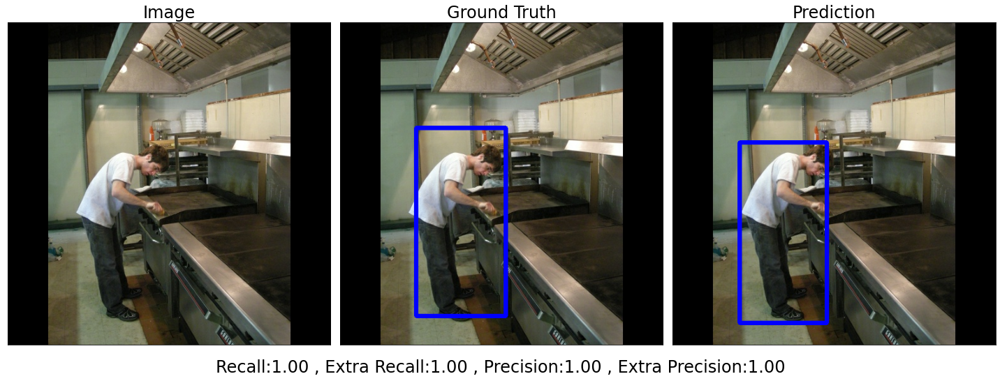

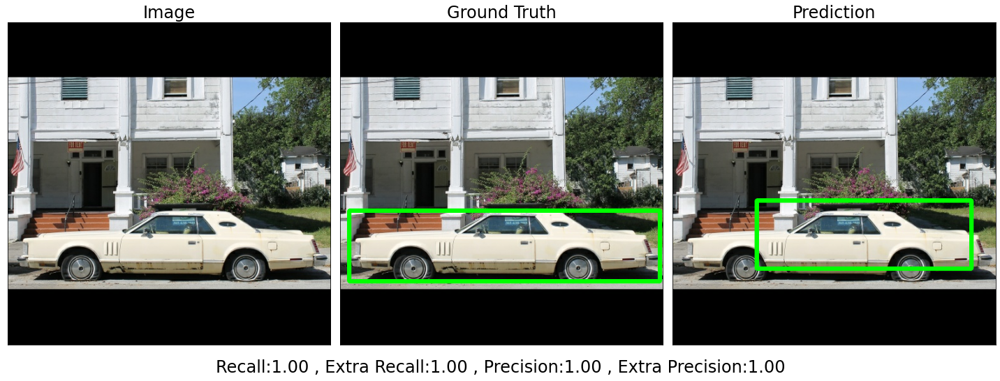

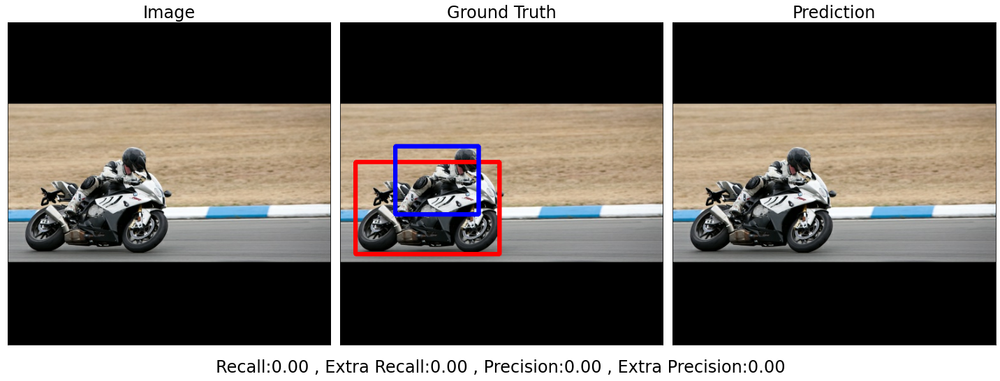

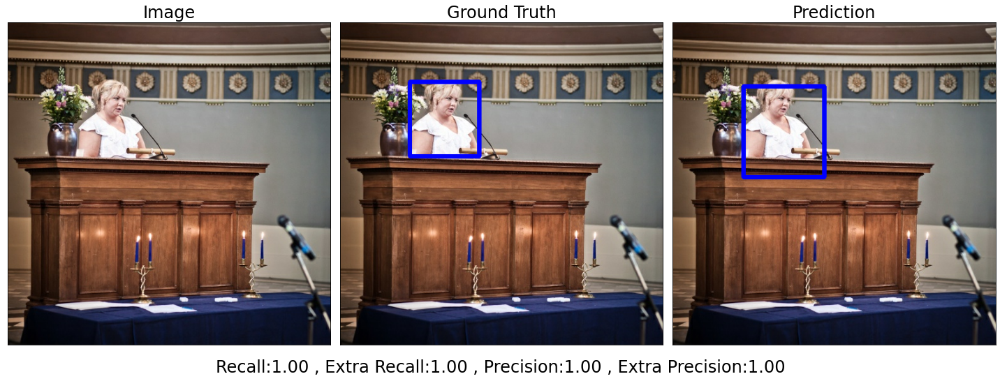

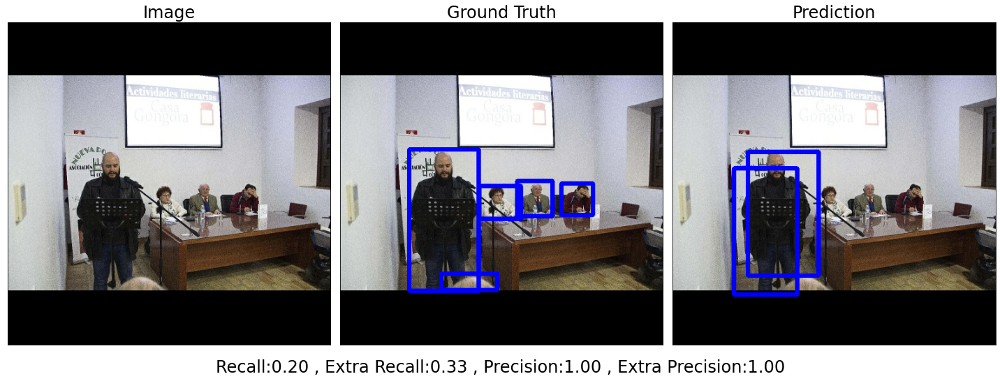

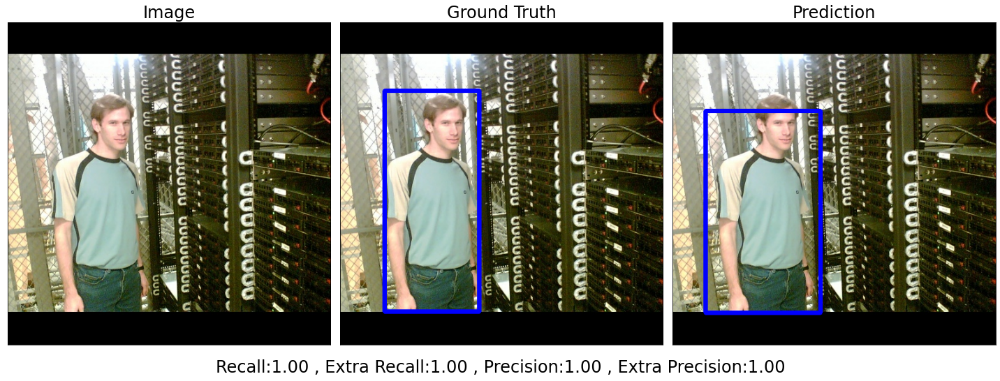

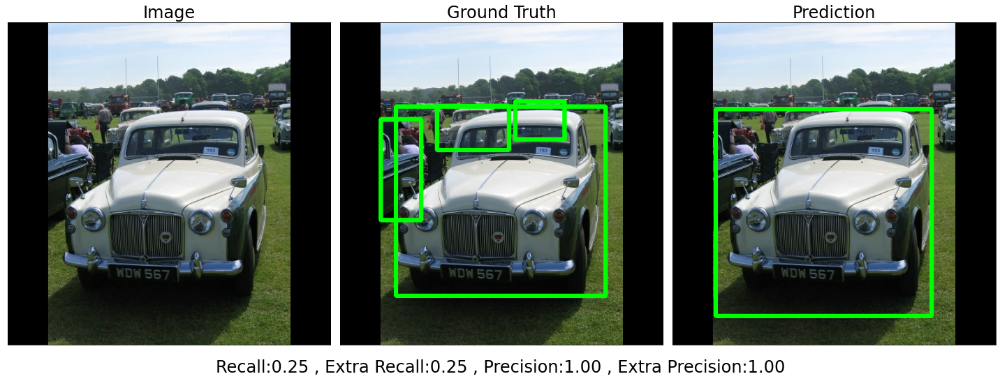

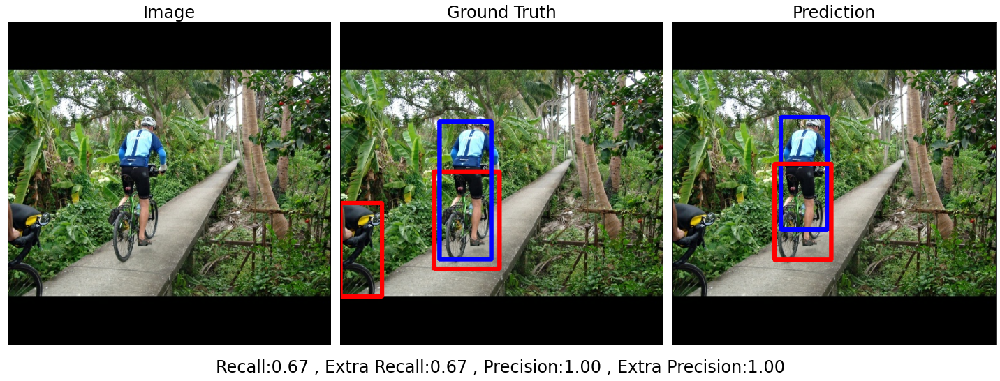

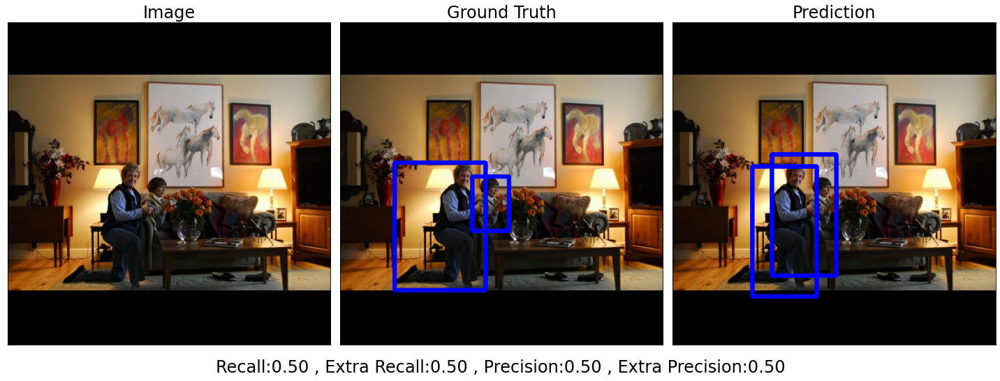

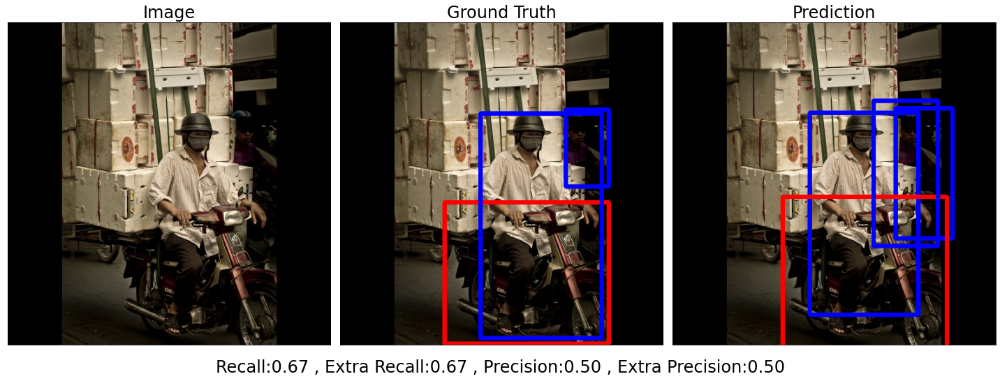

In [ ]:
for Useless in range(10):
  img, detector_mask, matching_true_boxes, class_one_hot, true_boxe_grid = next(val_gen)
  Indice_Variabile = 0

  if len(img) != 1:
    img=img[Indice_Variabile:Indice_Variabile+1]
    true_boxe_grid=true_boxe_grid[Indice_Variabile:Indice_Variabile+1]
    if caricato:
      y_pred=model_uploaded.predict_on_batch(img)
    else:
      y_pred = model.predict_on_batch(img)
    y_pred=y_pred[Indice_Variabile:Indice_Variabile+1]

  #score=SCORE_THRESHOLD
  score=0.6

  Recall,ExtraRecall,Precision,ExtraPrecision = risultati_aux(true_boxe_grid[Indice_Variabile:Indice_Variabile+1], y_pred[Indice_Variabile:Indice_Variabile+1], score=score, iou_threshold=IOU_THRESHOLD)
  # Calculate image
  img1,img2 = draw_boxes(true_boxe_grid, y_pred, img[0],score=score)

  # plot img, ground truth and prediction
  f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20, 10))

  f.suptitle('Recall:{:.2f} , Extra Recall:{:.2f} , Precision:{:.2f} , Extra Precision:{:.2f}'.format(Recall, ExtraRecall, Precision, ExtraPrecision),fontsize=24,y=0.15)

  ax1.imshow(img[0,...])
  ax1.set_title('Image',fontsize=24)
  ax1.set_xticks([])
  ax1.set_yticks([])

  ax2.imshow(img1)
  ax2.set_title('Ground Truth',fontsize=24)
  ax2.set_xticks([])
  ax2.set_yticks([])

  ax3.imshow(img2)
  ax3.set_title('Prediction',fontsize=24)
  ax3.set_xticks([])
  ax3.set_yticks([])

  f.tight_layout()
  #plt.savefig(os.path.join('drive/My Drive/Colab Notebooks/Images/', Dataset+"_Score:"+str(score)+"_"+str(int(time()))+".png"))